This code snaps a point cloud to a grid using a version of the auction algorithm optimized for best mapping between two point sets based on euclidean distance (euclidean bipartite matching or EBM).

To speed up the auction algorithm, first we run ICA on the point cloud to find a more "square" layout of the points. Then we use histogram equalization to spread the points across the space more evenly.

The code ingests:

- A point cloud in a `.npy` file, for example `umap/detectron-supervised/0.100_03.npy`

And outputs:

- A point cloud `assignment.npy` where each point corresponds to the same row as the input `.npy` file.

The input point cloud is forced to a filled square by the line `side = 243` which means the output grid is a point cloud with $243\times243 = 59049$ points.

In [9]:
from numba import jit
import numpy as np
import matplotlib.pyplot as plt

In [19]:
@jit(nopython=True)
def auction(lhs, rhs, eps_beg=0.1, eps_end=0.001, eps_factor=5, thresh=0.2, thresh_factor=5):
    index_dtype = np.int32
    cost_dtype = np.float32
    n = len(lhs)
    price = np.zeros(n, dtype=cost_dtype)
    ismall = -1000000000 # smallest possible cost
    eps = eps_beg
    thresh *= n   
    phase = 0
    while True:
        print('phase', phase)
        phase += 1
        object_assign = -np.ones(n, dtype=index_dtype)
        owner_queue = list(range(n))
        while True:
            next_queue = [0][1:] # numba hack: make typed empty list
            for cur_owner in owner_queue:
                best_object = 0
                best_value = ismall
                next_value = ismall
                for cur_object in range(n):
                    dx = lhs[cur_object,0] - rhs[cur_owner,0]
                    dy = lhs[cur_object,1] - rhs[cur_owner,1]
                    a = dx * dx + dy * dy
                    a = -a
                    value = a - price[cur_object]
                    if value > next_value:
                        if value <= best_value:
                            next_value = value
                        else:
                            next_value = best_value
                            best_value = value
                            best_object = cur_object
                if object_assign[best_object] > -1:
                    next_queue.append(object_assign[best_object])
                object_assign[best_object] = cur_owner
                gamma = (best_value - next_value) + eps
                price[best_object] += gamma
            owner_queue = next_queue
            remaining = len(next_queue)
            if eps == eps_end and remaining == 0:
                return object_assign
            if remaining < thresh:
                break
        eps /= eps_factor
        thresh /= thresh_factor
        if eps < eps_end:
            eps = eps_end
            thresh = 0

In [22]:
from sklearn.decomposition import FastICA

def ica_standardize(xy):
    ica = FastICA()
    std = ica.fit_transform(xy)
    return std / std.std(axis=0)

lhs = np.load('../data/embeddings/detectron-supervised/0.100_03.npy')
side = 243
n = side * side
lhs = lhs[:n]

lhs = ica_standardize(lhs)
lhs -= lhs.min(axis=0)
lhs /= lhs.max(axis=0)
lhs = lhs.astype(np.float32)

xv, yv = np.meshgrid(np.linspace(0, 1, side), np.linspace(0, 1, side))
rhs = np.dstack((xv, yv)).reshape(-1, 2).astype(np.float32)

lhs.dtype == rhs.dtype, lhs.dtype == np.float32

(True, True)

In [142]:
def histogram_equalize_1d(x):
    indices = np.argsort(x)
    x[indices] = np.linspace(x.min(), x.max(), len(x))
    
def histogram_equalize_2d(x):
    histogram_equalize_1d(x[:,0])
    histogram_equalize_1d(x[:,1])
    
def sort_quadrants(xy):
    n = len(xy)
    y_mid = xy[:,0].mean()
    x_mid = xy[:,1].mean()
    quadrant = (xy[:,0]>y_mid)*2 + (xy[:,1]>x_mid)*1
    indices = np.argsort(quadrant)
    xy[indices] = xy
    
# this won't really work, because the edges of each quadrant
# don't line up. for it to work, you'd have to blend each quadrant
# into the the displacement of the next scale up.
def organize(xy, levels):
    histogram_equalize_2d(xy)
    if levels == 0:
        return
    sort_quadrants(xy)
    chunk = len(xy) // 4
    levels -= 1
    organize(xy[0*chunk:1*chunk], levels)
    organize(xy[1*chunk:2*chunk], levels)
    organize(xy[2*chunk:3*chunk], levels)
    organize(xy[3*chunk:4*chunk], levels)

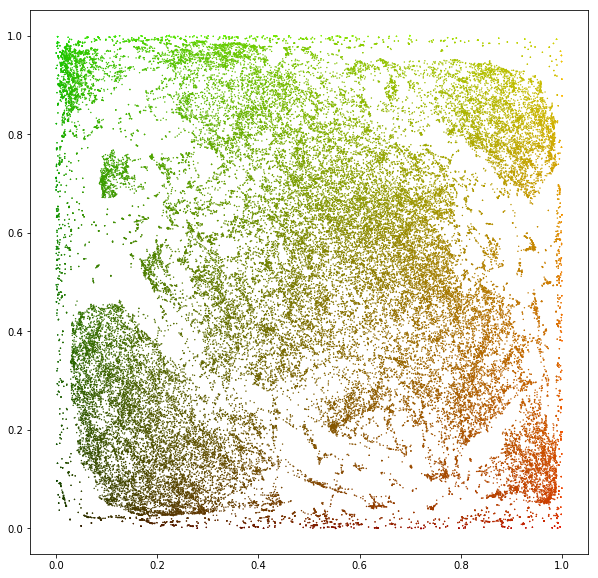

In [146]:
n = len(lhs)
colors = np.zeros((n, 3))
lhs_eq = np.hstack((lhs, colors))
brightness = ((np.mod(lhs_eq[:,0] * 20, 1) < .2) + (np.mod(lhs_eq[:,1] * 20, 1) < .2))*1
# lhs_eq[:,2] = brightness
# lhs_eq[:,3] = 0
# lhs_eq[:,4] = 1-brightness
lhs_eq[:,2] = lhs_eq[:,0]
lhs_eq[:,3] = lhs_eq[:,1]

organize(lhs_eq, 0)

colors = lhs_eq[:,2:].astype(np.float32)

plt.figure(figsize=(10,10))
plt.scatter(lhs_eq[:,0], lhs_eq[:,1], lw=0, s=2, c=colors)
plt.show()

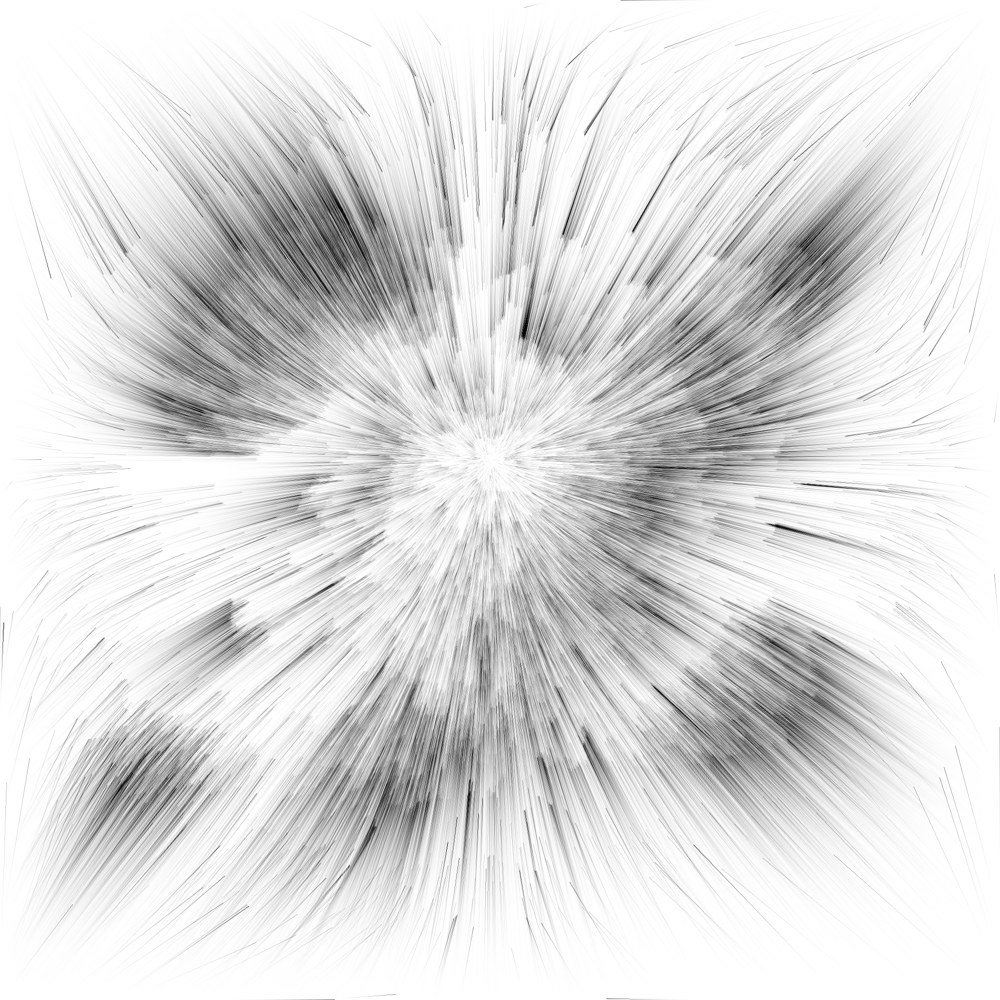

In [147]:
a = lhs_eq[:,0:2]
b = lhs_eq[:,2:4]

imshow(render_ebm(a, b))

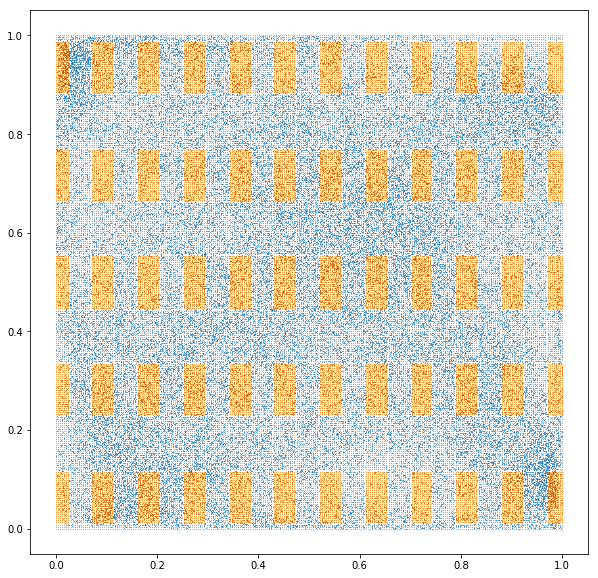

In [25]:
plt.figure(figsize=(10,10))
plt.scatter(lhs_eq[:,0], lhs_eq[:,1], lw=0, s=1)
plt.scatter(rhs[:,0], rhs[:,1], lw=0, s=1)
plt.show()

In [27]:
# matching rhs to lhs can be faster for the default case, slower if the points are all spread out
%time assign = auction(rhs, lhs_eq)

phase 0
phase 1
phase 2
phase 3
CPU times: user 6min 58s, sys: 1.99 s, total: 7min
Wall time: 6min 57s


In [26]:
# matching lhs to rhs is slower (5-7min)
%time assign = auction(lhs_eq, rhs)

phase 0
phase 1
phase 2
phase 3
CPU times: user 5min 18s, sys: 1.62 s, total: 5min 20s
Wall time: 5min 18s


In [28]:
assign_original = np.copy(assign)
assign_invert = np.zeros_like(assign)
for i, j in enumerate(assign):
    assign_invert[j] = i

In [108]:
from utils.imutil import imshow
from skimage.draw import line, line_aa
from utils.imutil import to_single_rgb
from utils.draw_shapes import draw_circle

def render_ebm(lhs, rhs, canvas_size=2048, r=2, fill=(255,0,0)):
    canvas = np.zeros((canvas_size, canvas_size), dtype=np.float32)
    scale = canvas_size - 1
    lhs_int = np.round(lhs*scale).astype(np.int32)
    rhs_int = np.round(rhs*scale).astype(np.int32)
    for (sx,sy), (ex,ey) in zip(lhs_int, rhs_int):
        # non-aa version
        rr, cc = line(sy,sx,ey,ex)
        val = np.linspace(0, 1, len(rr))**2
        
        canvas[rr,cc] += val
    brightness = 2
    canvas = 255-np.clip(brightness * canvas * 255 / canvas.max(), 0, 255)
    canvas = to_single_rgb(canvas)
#     for pt in lhs_int:
#         draw_circle(canvas, pt, r=r, fill=fill)
    return canvas

In [27]:
# np.save('assignment.npy', np.ascontiguousarray(rhs[assign]).astype(np.float32))

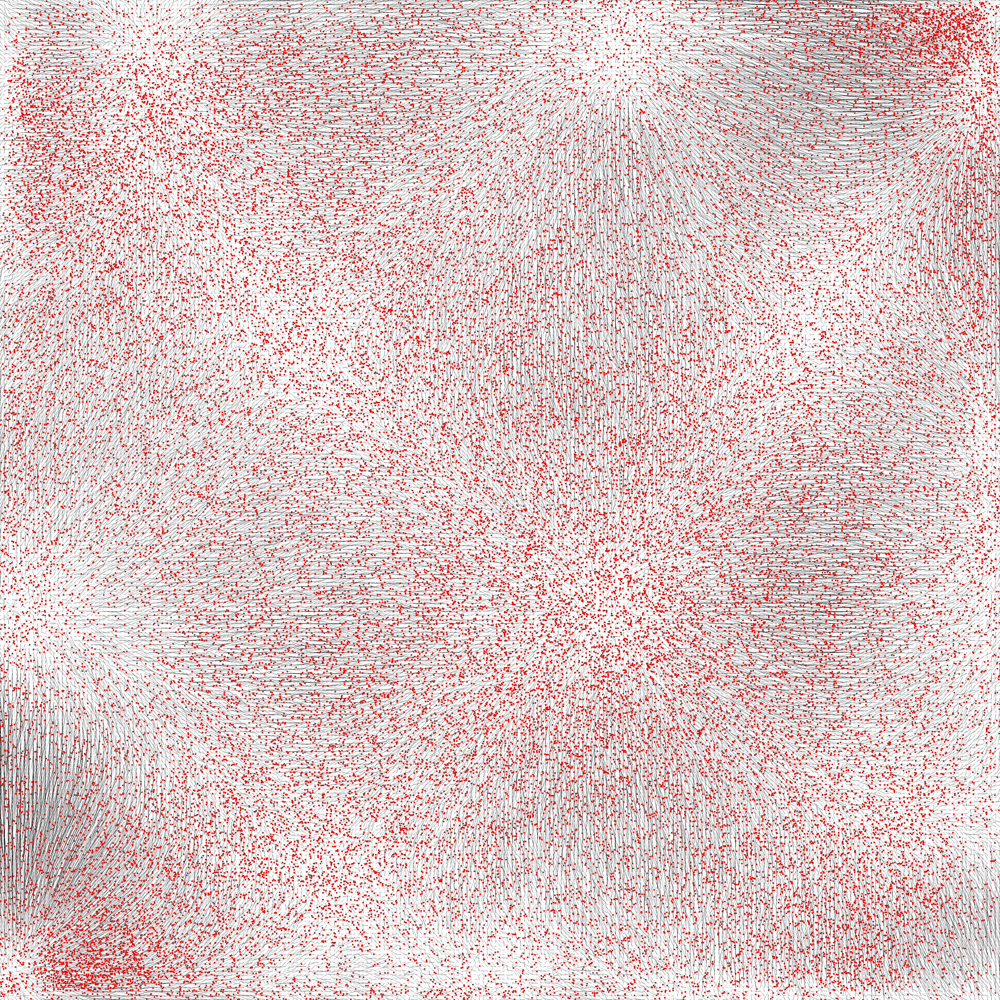

In [33]:
imshow(render_ebm(lhs_eq[assign], rhs))